In [1]:
import cv2
import numpy as np
from os.path import join
import os
import matplotlib.pyplot as plt
import random
import datetime
import pandas as pd
# placeholder path
dir_RK = r"C:\Users\roma0\cvpr_group\lab_2\images\RK_dataset\test"
dir_RB = r"C:\Users\roma0\cvpr_group\lab_2\images\RB_dataset\test"
dir_AS = r"C:\Users\roma0\cvpr_group\lab_2\images\AS_dataset\test"
dir_NO = r"C:\Users\roma0\cvpr_group\lab_2\images\Rdataset\without"
dir_test_RK = r"C:\Users\roma0\cvpr_group\lab_2\images\RK_dataset\test_RK2"
dir_test_RB = r"C:\Users\roma0\cvpr_group\lab_2\images\RK_dataset\test_RB2"
dir_test_AS = r"C:\Users\roma0\cvpr_group\lab_2\images\RK_dataset\test_AS2"
dir_test_NO = r"C:\Users\roma0\cvpr_group\lab_2\images\RK_dataset\test_without2"

In [2]:
def extractor(fn):
  im = cv2.imread(fn,0)
  im = cv2.resize(im, (im.shape[0]//4, im.shape[1]//4), interpolation = cv2.INTER_AREA)
  return extract.compute(im, detect.detect(im))[1]

def form_voc(path, number):
  k = 0
  for filename in os.listdir(path):
      k=k+1
      bow_kmeans_trainer.add(extractor(os.path.join(path, filename)))
      if k == number:
        break  

def form_train_set(number):
    traindata, trainlabels = [],[]

    k = 0
    for filename in os.listdir(dir_RK):
        k = k+1
        traindata.extend(bow_features(os.path.join(dir_RK, filename))); trainlabels.append(1)

        if k == number:
            break
    k = 0
    for filename in os.listdir(dir_RB):
        k = k+1
        traindata.extend(bow_features(os.path.join(dir_RB, filename))); trainlabels.append(2)

        if k == number:
            break
    k = 0
    for filename in os.listdir(dir_AS):
        k = k+1
        traindata.extend(bow_features(os.path.join(dir_AS, filename))); trainlabels.append(3)

        if k == number:
            break  
    k = 0
    for filename in os.listdir(dir_NO):
        k = k+1
        traindata.extend(bow_features(os.path.join(dir_NO, filename))); trainlabels.append(4)

        if k == number:
            break
    return traindata, trainlabels  

    
def bow_features(fn):
  im = cv2.imread(fn,0)
  im = cv2.resize(im, (im.shape[0]//4, im.shape[1]//4), interpolation = cv2.INTER_AREA)
  return extract_bow.compute(im, detect.detect(im))

def predict(fn):
  f = bow_features(fn);  
  p = svm.predict(f)
  return p
def test_obj(path, metric, Id):
    for filename in os.listdir(path):
        metric[0].append(filename)
        img = cv2.imread(os.path.join(path, filename), 0) 
        img = cv2.resize(img, (img.shape[0]//4, img.shape[1]//4), interpolation = cv2.INTER_AREA)
        start_time = datetime.datetime.now()
        img_predict = predict(os.path.join(path, filename))
        end_time = datetime.datetime.now()
        time_diff = (end_time - start_time)
        time = time_diff.total_seconds()
        metric[2].append(time)
        if (img_predict[1][0][0] != Id):
            metric[1].append(1)
        else: 
            metric[1].append(0) 
        plt.imshow(img),plt.show()
        print(img_predict[1][0][0])
        print()
   
def test_noobj(path, metric, Id):
    for filename in os.listdir(path):
        metric[0].append(filename)
        img = cv2.imread(os.path.join(path, filename), 0)
        img = cv2.resize(img, (img.shape[0]//4, img.shape[1]//4), interpolation = cv2.INTER_AREA)
        start_time = datetime.datetime.now()
        img_predict = predict(os.path.join(path, filename))
        end_time = datetime.datetime.now()
        time_diff = (end_time - start_time)
        time = time_diff.total_seconds()
        metric[2].append(time)
        if (img_predict[1][0][0] != 4):
            metric[1].append(1)
        else: 
            metric[1].append(0)    
        plt.imshow(img),plt.show()
        print(img_predict[1][0][0])
        print()
 

In [3]:

detect = cv2.xfeatures2d.SURF_create()
extract = cv2.xfeatures2d.SURF_create()

flann_params = dict(algorithm = 1, trees = 5)
matcher = cv2.FlannBasedMatcher(flann_params, {})

bow_kmeans_trainer = cv2.BOWKMeansTrainer(40)
extract_bow = cv2.BOWImgDescriptorExtractor(extract, matcher)

form_voc(dir_RK, 20)
form_voc(dir_RB, 20)
form_voc(dir_AS, 20)
form_voc(dir_NO, 20)

voc = bow_kmeans_trainer.cluster()
extract_bow.setVocabulary(voc)

traindata, trainlabels = form_train_set(40)
print(traindata)
print(trainlabels)

c = list(zip(traindata,trainlabels))
random.shuffle(c)
traindata, trainlabels = zip(*c)

print(traindata)
print(trainlabels)

svm = cv2.ml.SVM_create()
svm.setKernel(2)
svm.setType(100)
svm.trainAuto(np.array(traindata), cv2.ml.ROW_SAMPLE, np.array(trainlabels))



[array([0.01531863, 0.04044118, 0.00735294, 0.00857843, 0.02879902,
       0.09007353, 0.03186275, 0.03063726, 0.02267157, 0.02696078,
       0.02879902, 0.01531863, 0.03002451, 0.02083333, 0.02267157,
       0.02205882, 0.04718138, 0.02941177, 0.0189951 , 0.02022059,
       0.01348039, 0.06127451, 0.00980392, 0.02696078, 0.00551471,
       0.01348039, 0.00796569, 0.03247549, 0.01164216, 0.00612745,
       0.02941177, 0.0245098 , 0.03063726, 0.03308824, 0.03982843,
       0.01348039, 0.00551471, 0.00428922, 0.03125   , 0.04105392],
      dtype=float32), array([0.01885014, 0.03722903, 0.03628652, 0.01413761, 0.01508011,
       0.05419416, 0.04099906, 0.02544769, 0.04995288, 0.02497644,
       0.03251649, 0.01178134, 0.02591894, 0.04288407, 0.01602262,
       0.03016023, 0.03581527, 0.01885014, 0.0193214 , 0.02073516,
       0.02968897, 0.01508011, 0.01366635, 0.01696513, 0.03393025,
       0.06456173, 0.00942507, 0.06032045, 0.00754006, 0.00282752,
       0.02262017, 0.00848256, 0.01178

True

In [4]:
'''font = cv2.FONT_HERSHEY_SIMPLEX

for filename in os.listdir(dir_test):
    capture = ""
    img = cv2.imread(os.path.join(dir_test, filename), 0) 
    img = cv2.resize(img, (img.shape[0]//4, img.shape[1]//4), interpolation = cv2.INTER_AREA)
    img_predict = predict(os.path.join(dir_test, filename))
    if (img_predict[1][0][0] == 1):
        capture+="Підкова"
    if (img_predict[1][0][0] == 2):
        capture+="Диск"
    if (img_predict[1][0][0] == 3):
        capture+="Синиця"
    if (img_predict[1][0][0] == 4):
        capture+="Немає об'єкту"
    plt.imshow(img),plt.show()
    print(capture)'''

'font = cv2.FONT_HERSHEY_SIMPLEX\n\nfor filename in os.listdir(dir_test):\n    capture = ""\n    img = cv2.imread(os.path.join(dir_test, filename), 0) \n    img = cv2.resize(img, (img.shape[0]//4, img.shape[1]//4), interpolation = cv2.INTER_AREA)\n    img_predict = predict(os.path.join(dir_test, filename))\n    if (img_predict[1][0][0] == 1):\n        capture+="Підкова"\n    if (img_predict[1][0][0] == 2):\n        capture+="Диск"\n    if (img_predict[1][0][0] == 3):\n        capture+="Синиця"\n    if (img_predict[1][0][0] == 4):\n        capture+="Немає об\'єкту"\n    plt.imshow(img),plt.show()\n    print(capture)'

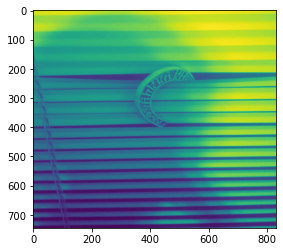

1.0



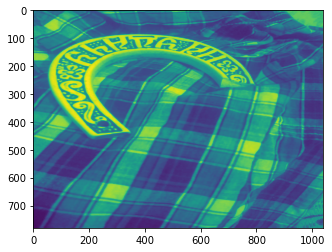

2.0



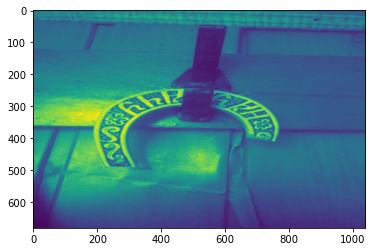

1.0



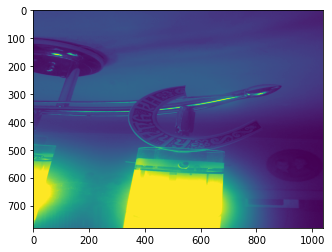

2.0



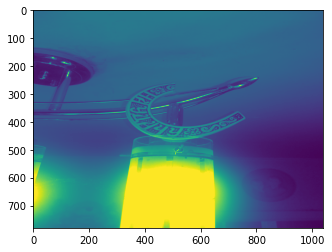

2.0



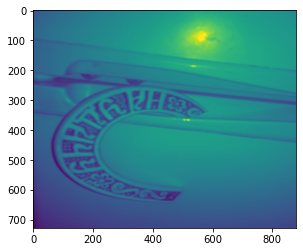

1.0



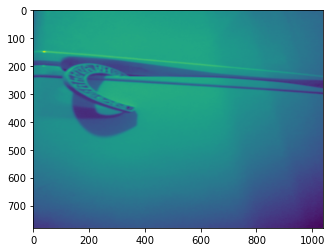

1.0



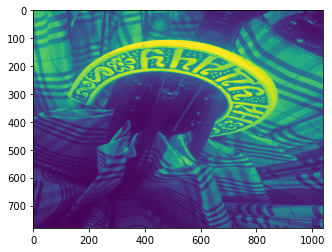

4.0



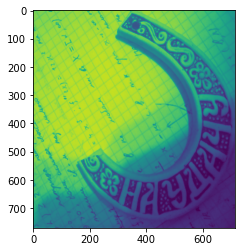

4.0



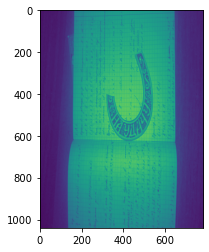

1.0



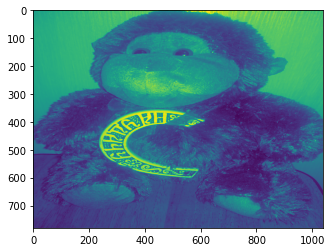

3.0



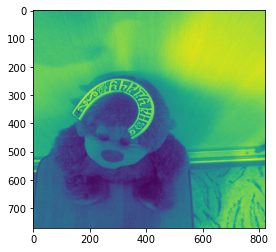

1.0



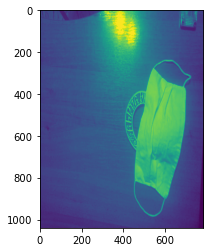

4.0



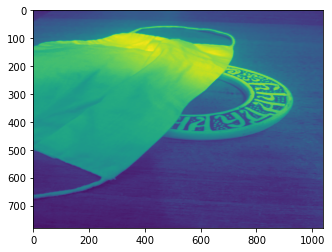

1.0



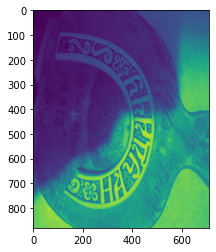

1.0



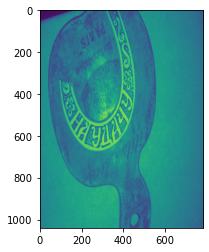

1.0



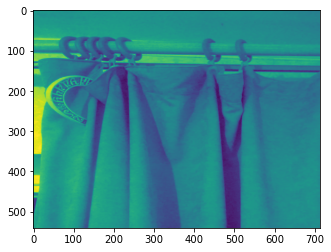

3.0



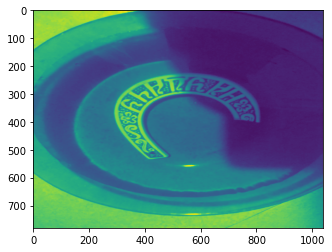

3.0



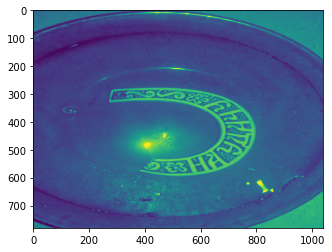

1.0



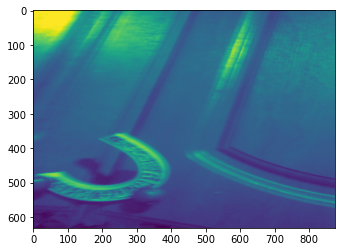

1.0



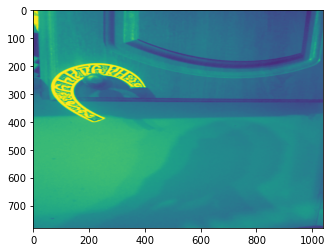

2.0



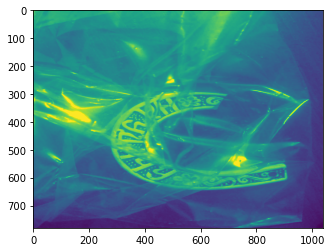

1.0



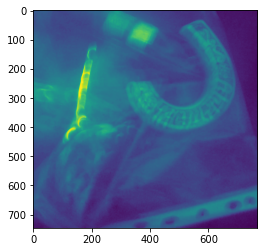

3.0



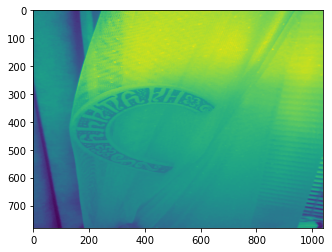

1.0



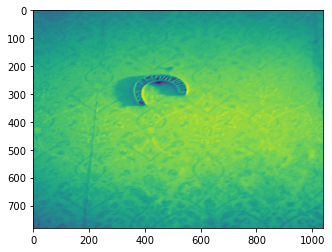

1.0



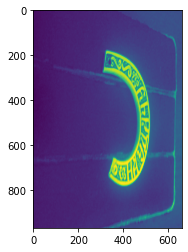

1.0



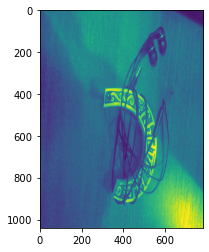

2.0



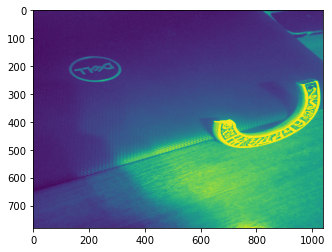

1.0



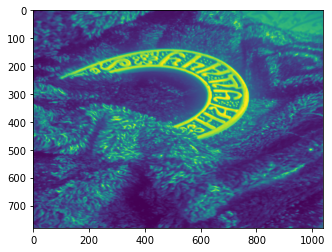

3.0



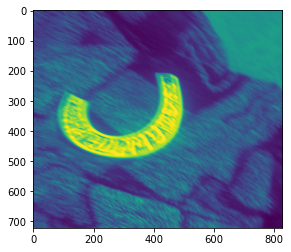

1.0



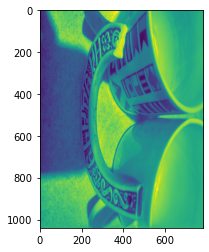

3.0



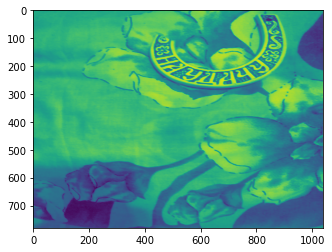

4.0



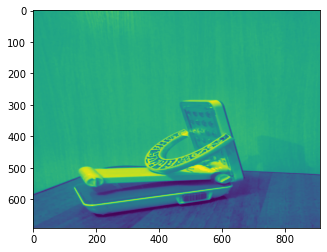

2.0



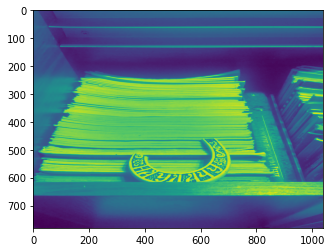

1.0



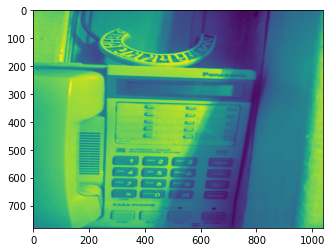

1.0



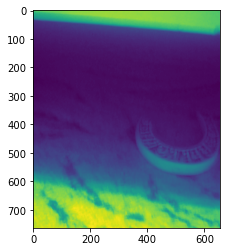

3.0



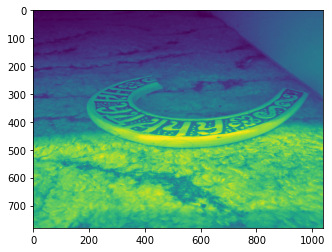

1.0



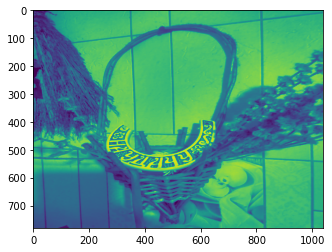

4.0



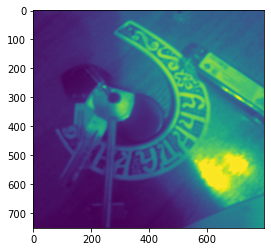

3.0



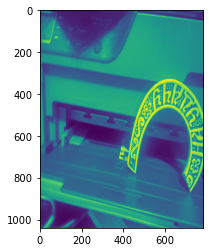

1.0



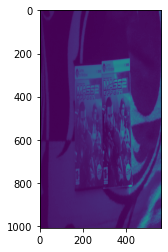

4.0



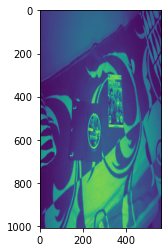

2.0



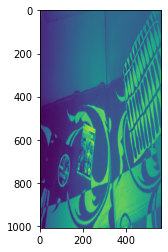

2.0



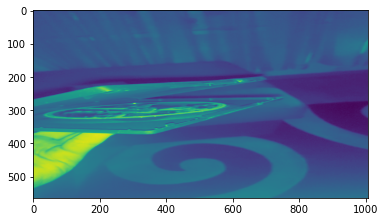

2.0



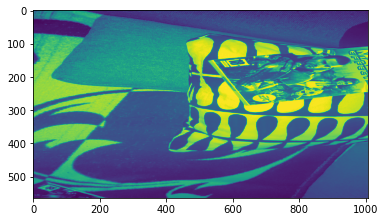

2.0



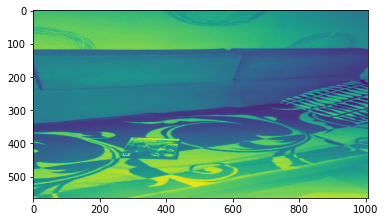

2.0



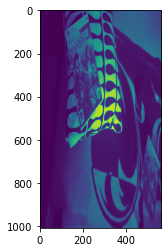

2.0



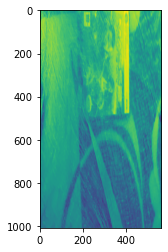

2.0



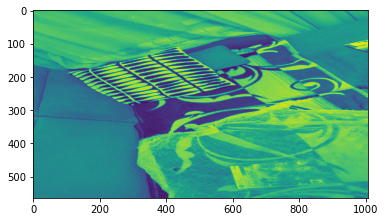

2.0



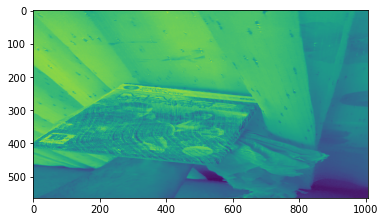

4.0



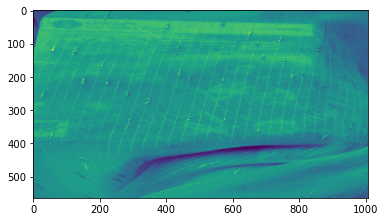

3.0



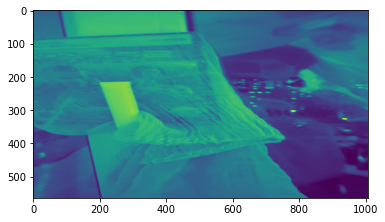

3.0



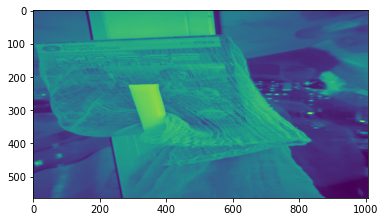

3.0



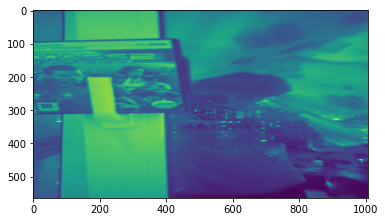

3.0



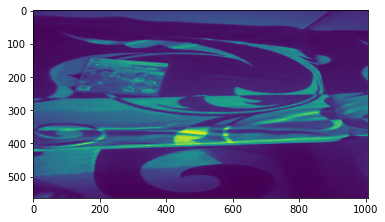

2.0



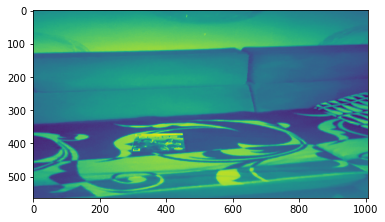

2.0



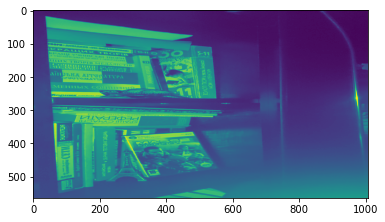

1.0



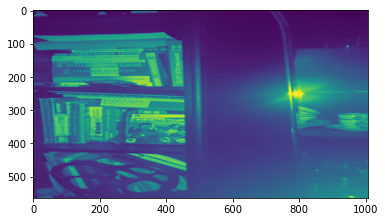

2.0



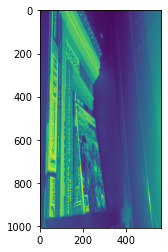

2.0



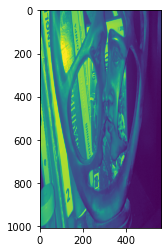

2.0



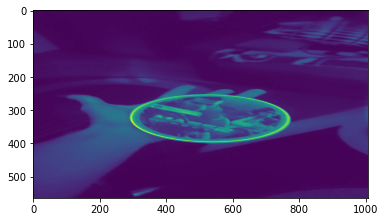

1.0



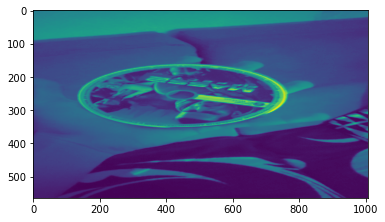

2.0



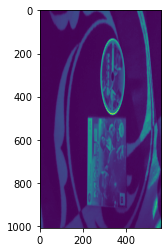

2.0



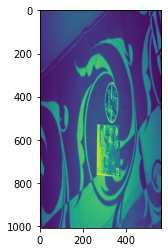

2.0



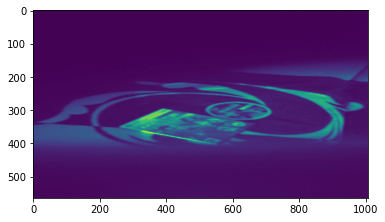

2.0



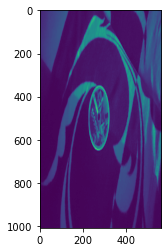

2.0



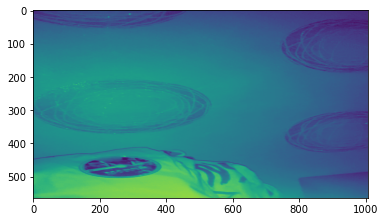

2.0



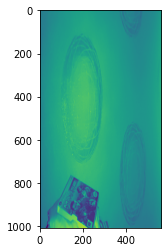

3.0



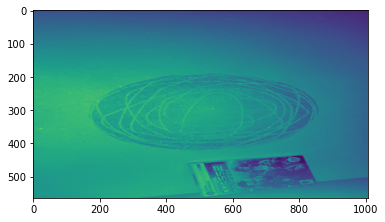

2.0



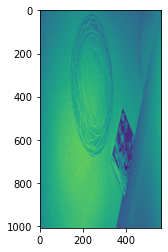

2.0



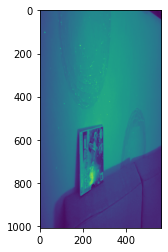

3.0



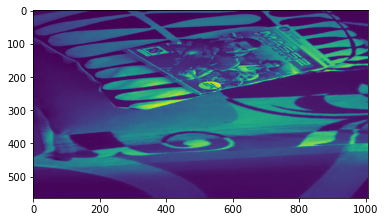

2.0



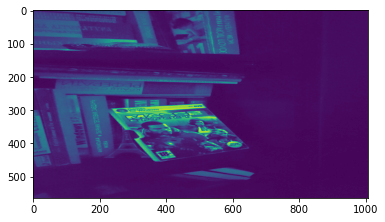

3.0



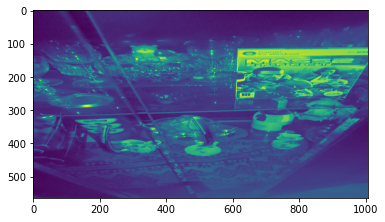

3.0



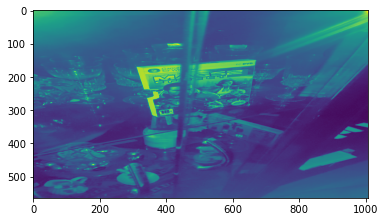

3.0



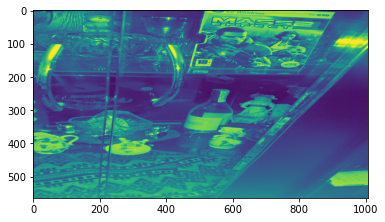

3.0



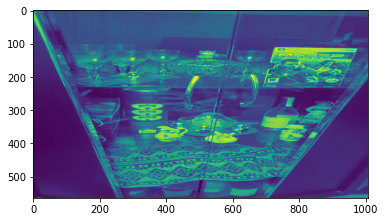

3.0



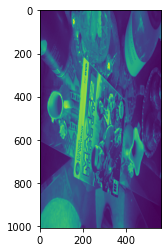

2.0



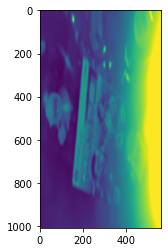

3.0



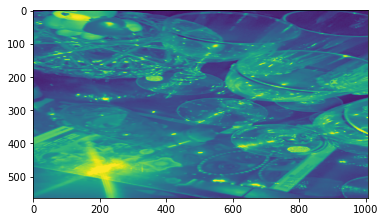

2.0



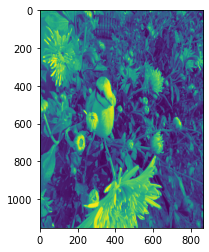

3.0



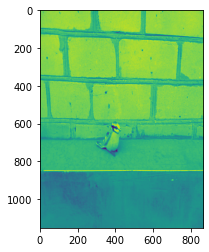

4.0



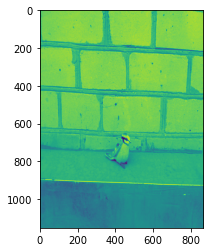

4.0



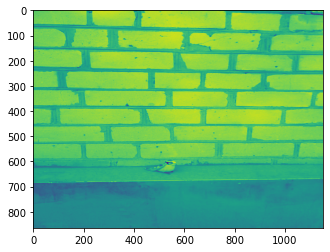

4.0



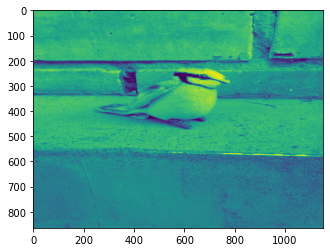

4.0



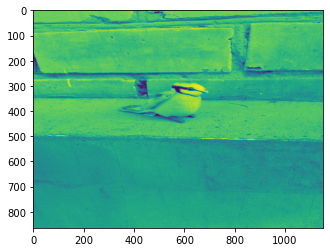

4.0



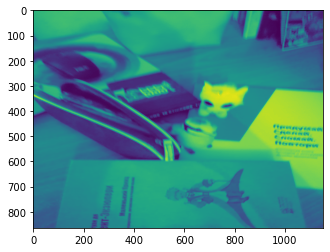

4.0



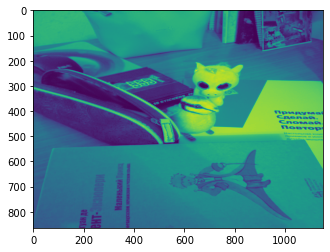

4.0



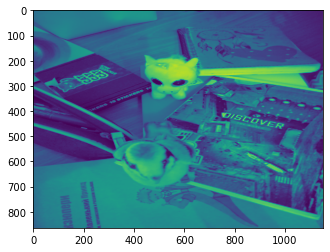

4.0



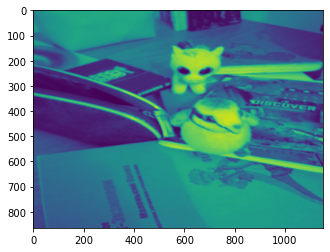

4.0



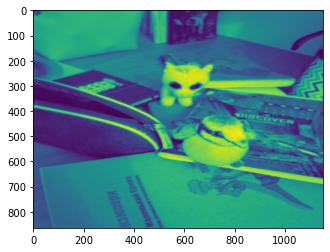

4.0



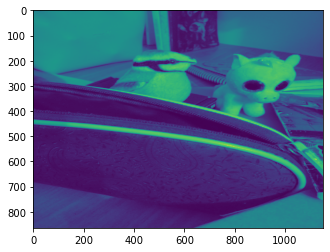

4.0



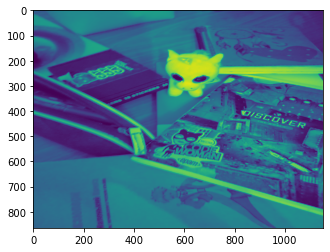

3.0



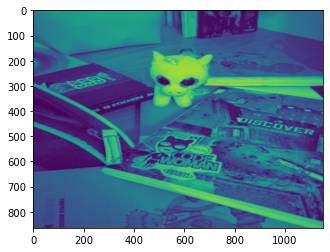

3.0



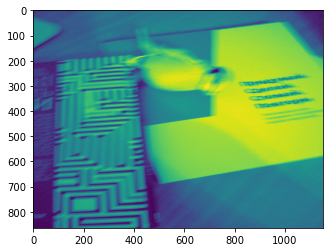

1.0



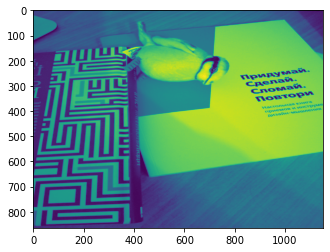

1.0



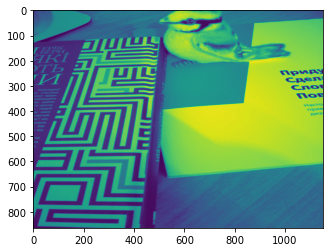

1.0



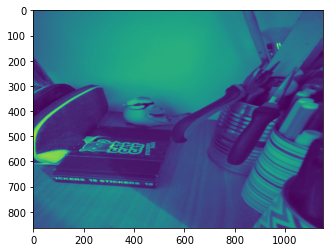

2.0



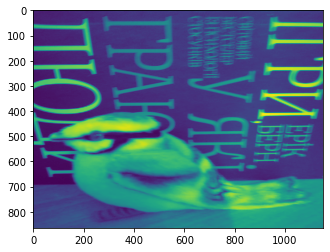

2.0



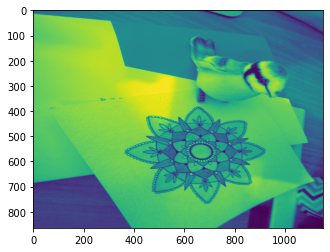

4.0



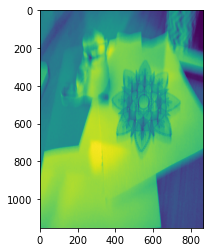

4.0



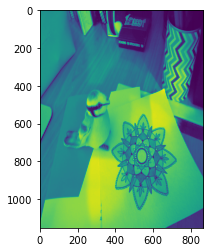

4.0



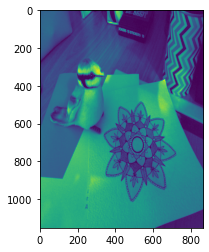

4.0



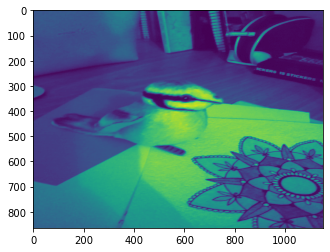

4.0



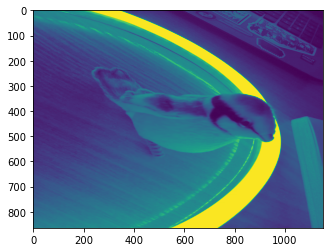

3.0



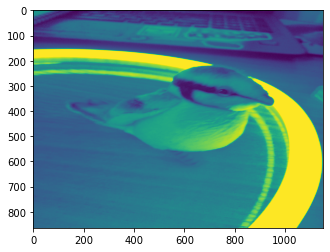

3.0



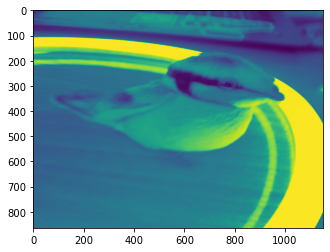

3.0



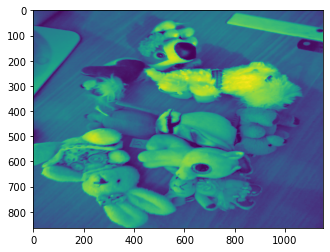

3.0



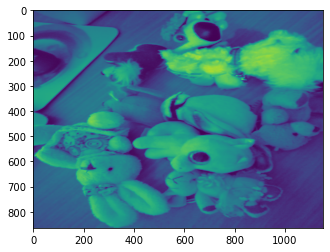

3.0



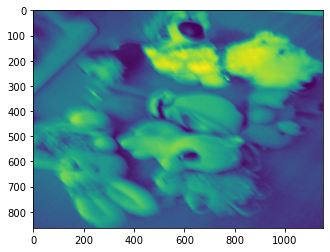

3.0



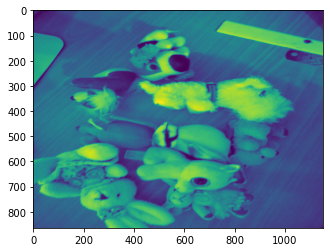

3.0



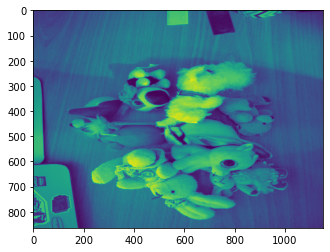

4.0



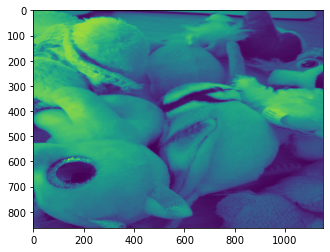

3.0



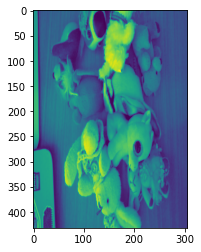

3.0



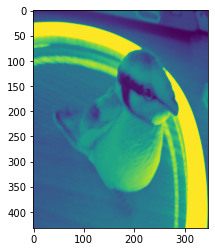

3.0



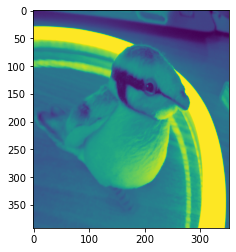

2.0



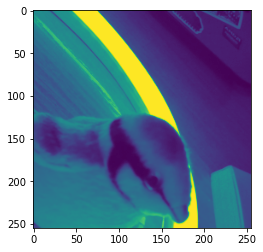

2.0



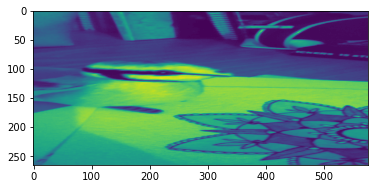

2.0



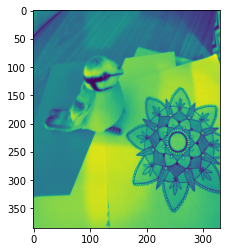

4.0



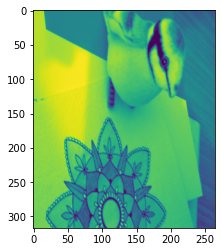

4.0



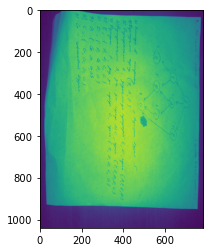

4.0



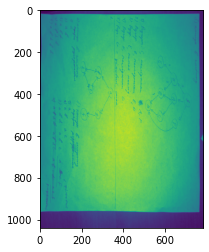

4.0



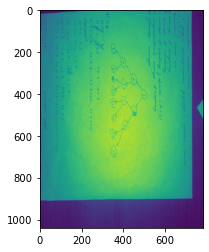

4.0



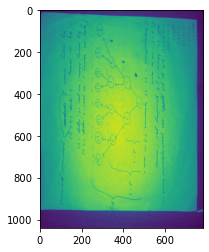

4.0



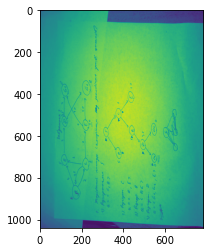

4.0



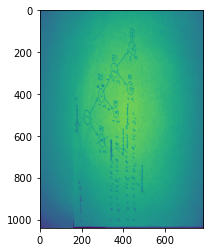

4.0



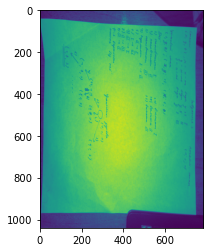

4.0



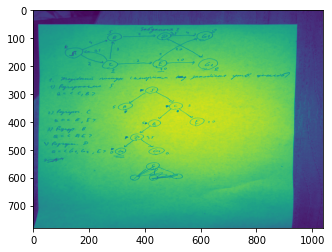

4.0



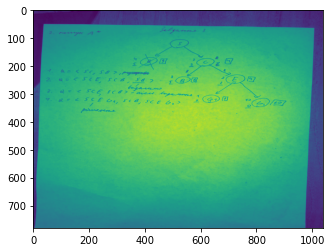

4.0



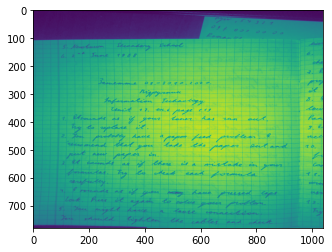

4.0



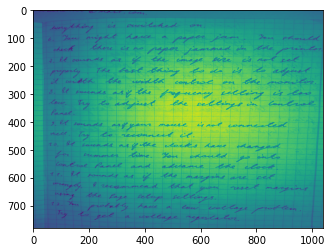

4.0



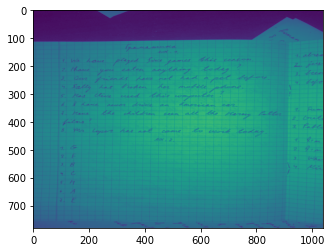

4.0



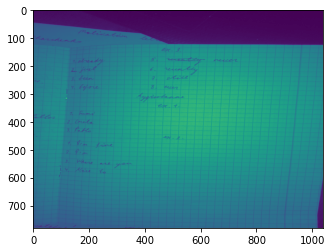

4.0



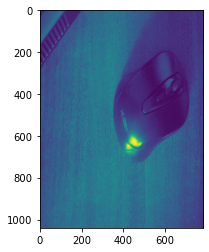

1.0



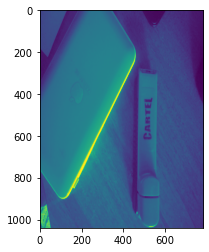

4.0



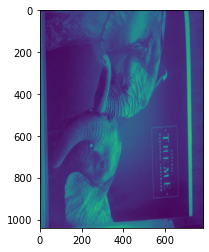

1.0



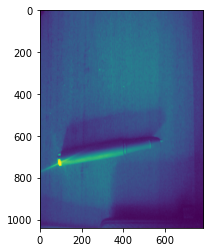

1.0



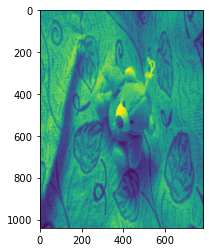

3.0



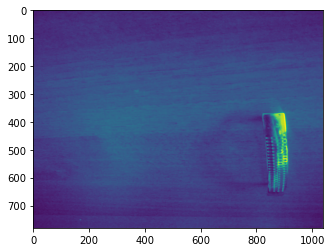

1.0



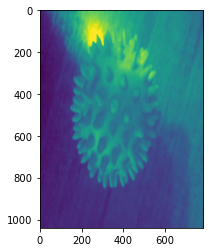

3.0



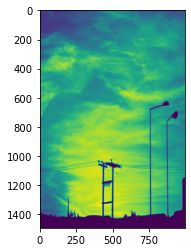

4.0



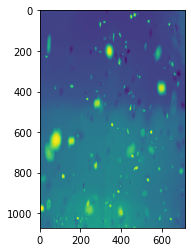

3.0



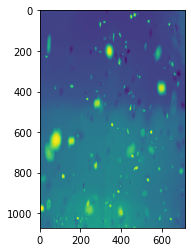

3.0



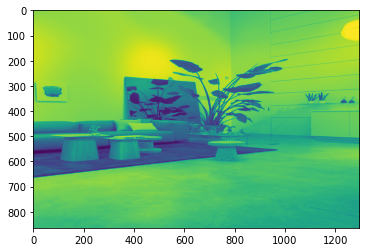

2.0



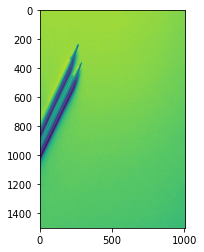

2.0



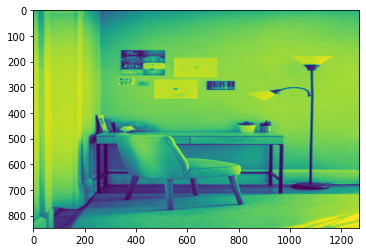

4.0



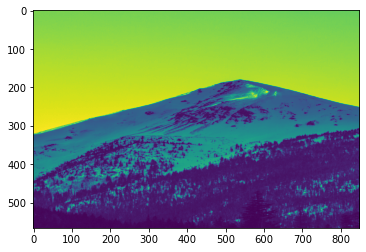

3.0



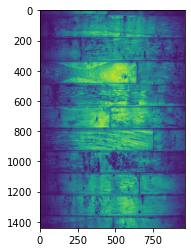

3.0



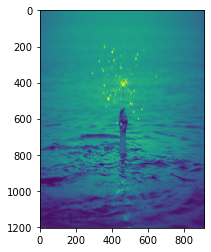

1.0



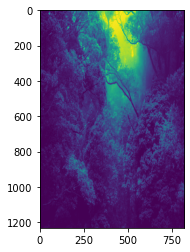

3.0



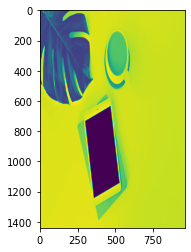

4.0



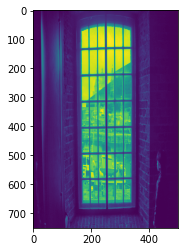

4.0



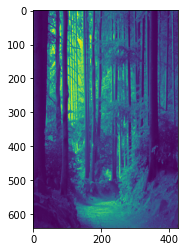

2.0



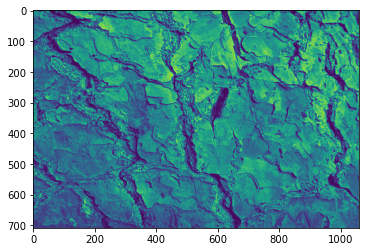

4.0



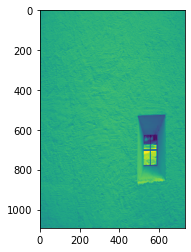

4.0



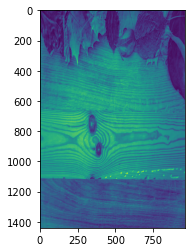

1.0



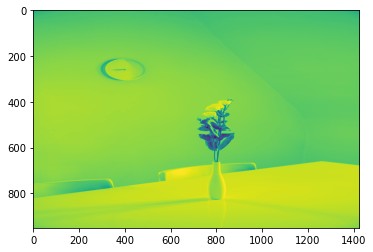

4.0



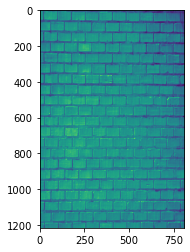

4.0



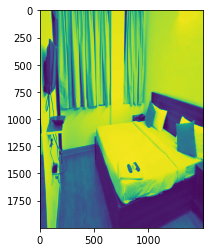

4.0



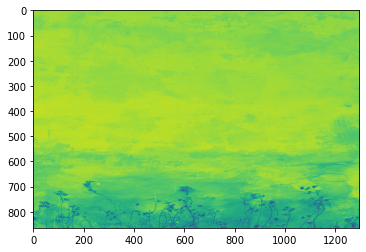

4.0

[['IMG_20200927_201040.jpg', 'IMG_20200927_201122.jpg', 'IMG_20200927_201218.jpg', 'IMG_20200927_201246.jpg', 'IMG_20200927_201253.jpg', 'IMG_20200927_201325.jpg', 'IMG_20200927_201335.jpg', 'IMG_20200927_201354.jpg', 'IMG_20200927_201601.jpg', 'IMG_20200927_201611.jpg', 'IMG_20200927_201708.jpg', 'IMG_20200927_201730.jpg', 'IMG_20200927_201826.jpg', 'IMG_20200927_201834.jpg', 'IMG_20200927_201927.jpg', 'IMG_20200927_201935.jpg', 'IMG_20200927_202032.jpg', 'IMG_20200927_202211.jpg', 'IMG_20200927_202235.jpg', 'IMG_20200927_202359.jpg', 'IMG_20200927_202417.jpg', 'IMG_20200927_203931.jpg', 'IMG_20200927_203948.jpg', 'IMG_20200927_204037.jpg', 'IMG_20200927_204142.jpg', 'IMG_20200927_204359.jpg', 'IMG_20200927_204438.jpg', 'IMG_20200927_204535.jpg', 'IMG_20200927_204853_HDR.jpg', 'IMG_20200927_204907_HDR.jpg', 'IMG_20200927_205015_HDR.jpg', 'IMG_20200927_205129_HDR.jpg', 'IMG_20200927_205316_HDR.jpg', 'IMG_20200927_205413_HDR.jpg', 'IMG_20200927_205438_HDR.jpg', 'IMG_20200927_205511

In [5]:
import datetime
import pandas as pd
metric_shoe = [[],[],[]]
metric_bird = [[],[],[]]
metric_disk = [[],[],[]]
metric_noobj = [[],[],[]]
test_obj(dir_test_RK, metric_shoe, 1)
test_obj(dir_test_RB, metric_disk, 2)
test_obj(dir_test_AS, metric_bird, 3)
test_noobj(dir_test_NO, metric_noobj, 4)  

df1 = pd.DataFrame({"filename " : metric_shoe[0], "eror I": metric_shoe[1], "time": metric_shoe[2]})
df2 = pd.DataFrame({"filename " : metric_disk[0], "eror I": metric_disk[1], "time": metric_disk[2]})
df3 = pd.DataFrame({"filename " : metric_bird[0], "eror I": metric_bird[1], "time": metric_bird[2]})
df4 = pd.DataFrame({"filename " : metric_noobj[0], "eror I": metric_noobj[1], "time": metric_noobj[2]})

df1.to_csv('RK_dataset_SURF.csv') 
df2.to_csv('RB_dataset_SURF.csv')
df3.to_csv('AS_dataset_SURF.csv')
df4.to_csv('Noobj_dataset_SURF.csv') 
print(metric_shoe)
print(metric_disk)
print(metric_bird)
print(metric_noobj)

In [7]:
font = cv2.FONT_HERSHEY_SIMPLEX
capture = cv2.VideoCapture("test2.mp4")
#fourcc = cv2.VideoWriter_fourcc('M','P','4','V')
fourcc = cv2.VideoWriter_fourcc(*'DIVX')
fps = 20
w, h = 720, 480
stream = cv2.VideoWriter("result.avi", fourcc, fps, (w, h))

while capture.isOpened():
    ret, frame = capture.read()
    if ret == False:
        break
    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)  
    frame_gray = cv2.cvtColor(frame_gray, cv2.COLOR_GRAY2RGB)
    #cv2.rectangle(frame_gray, (w//2,h//2 ), (50, 50), (150, 0, 255), 2)
    #cv2.line(frame_gray, (0, 10), (w-10, 10), (250, 0, 0), 2)
    f = extract_bow.compute(frame_gray, detect.detect(frame_gray))
    img_predict = svm.predict(f)
    if (img_predict[1][0][0] == 1.0):
      cv2.putText(frame_gray,'+',(10,60), font, 3, (0,255,0),1,cv2.LINE_AA)
    else:
      cv2.putText(frame_gray,'-',(10,60), font, 3, (0,0,255),1,cv2.LINE_AA)
    stream.write(frame_gray)
    cv2.imshow('frame2', frame_gray)

    if cv2.waitKey(25) == ord('q'):
        break
capture.release()
#stream.release()
cv2.destroyAllWindows()


In [ ]:
'''capture = cv.VideoCapture("test.avi")
    
    stream = cv.VideoWriter("test_gray.avi", fourcc, fps, (w, h))
    while (capture.isOpened()):
        ret, frame = capture.read()
        if ret == False:
            break
        frame_gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)  
        frame_gray = cv.cvtColor(frame_gray, cv.COLOR_GRAY2RGB)
        cv.rectangle(frame_gray, (w//2,h//2 ), (50, 50), (0, 150, 255), 2)
        cv.line(frame_gray, (0, 10), (w-10, h//2), (250, 0, 0), 2)
        stream.write(frame_gray)
        cv.imshow('gray video', frame_gray)
        cv.imshow('video', frame)
        if cv.waitKey(25) == ord('q'):
            break
    capture.release()        
    cv.destroyAllWindows()  
'''    